## Alireza Heidari


# Imports

In [1]:
from google.colab import drive

drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import torch
import os
from torchvision.datasets import CocoCaptions
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import io, transforms
import torchvision.datasets as dset
from tqdm.auto import tqdm
import random
from PIL import Image
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments
from transformers import default_data_collator
# import datasets
import evaluate
import nltk
import matplotlib.pyplot as plt
import numpy as np
from typing import Callable, Dict, List, Optional, Tuple, Union
from transformers import pipeline

# Config

In [4]:
VIT_MODEL = "google/vit-base-patch16-224-in21k"
DISTIL_GPT2 = "distilgpt2"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [5]:
DATA_PATH =  './'

# Load The Model

In [6]:
from transformers import VisionEncoderDecoderModel, AutoTokenizer, AutoFeatureExtractor


model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(VIT_MODEL, DISTIL_GPT2)
feature_extractor = AutoFeatureExtractor.from_pretrained(VIT_MODEL)
tokenizer = AutoTokenizer.from_pretrained(DISTIL_GPT2)

tokenizer.pad_token = tokenizer.eos_token
model.config.eos_token_id = tokenizer.eos_token_id
model.config.decoder_start_token_id = tokenizer.bos_token_id
model.config.pad_token_id = tokenizer.pad_token_id

# for name, param in model.named_parameters(): # due to lack of gpu
#     if "crossattention" not in name:
#         param.requires_grad = False
model = model.to(device)
model

Some weights of GPT2LMHeadModel were not initialized from the model checkpoint at distilgpt2 and are newly initialized: ['transformer.h.4.crossattention.masked_bias', 'transformer.h.3.crossattention.c_proj.bias', 'transformer.h.3.crossattention.q_attn.weight', 'transformer.h.5.crossattention.c_attn.weight', 'transformer.h.2.crossattention.bias', 'transformer.h.0.crossattention.c_proj.bias', 'transformer.h.1.crossattention.masked_bias', 'transformer.h.4.crossattention.c_proj.bias', 'transformer.h.5.crossattention.q_attn.weight', 'transformer.h.1.crossattention.bias', 'transformer.h.4.crossattention.c_proj.weight', 'transformer.h.3.crossattention.bias', 'transformer.h.2.crossattention.c_attn.weight', 'transformer.h.4.crossattention.c_attn.weight', 'transformer.h.2.ln_cross_attn.weight', 'transformer.h.2.crossattention.c_proj.bias', 'transformer.h.3.crossattention.masked_bias', 'transformer.h.5.ln_cross_attn.weight', 'transformer.h.3.ln_cross_attn.weight', 'transformer.h.4.crossattention.

VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_featur

# Prepare Dataset

In [7]:
train_dataset = CocoCaptions(
    root='./train2017/',
    annFile = './annotations/captions_train2017.json',
    transform=transforms.ToTensor(),
    target_transform=lambda x: random.choice(x)
)
validation_dataset = CocoCaptions(
    root='./val2017/',
    annFile = './annotations/captions_val2017.json',
    transform=transforms.ToTensor(),
    target_transform=lambda x: random.choice(x)
)

loading annotations into memory...
Done (t=3.65s)
creating index...
index created!
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


# Define Metrics

In [8]:
rouge = evaluate.load("rouge")
bleu = evaluate.load("bleu")
bert = evaluate.load('bertscore')
nltk.download('punkt')

In [10]:
def compute_metrics(eval_preds):
    def get_bleu_score(preds, refs, max_order=1):
      try:
          
          return bleu.compute(
              predictions=preds,
              references=refs,
              max_order=max_order,
          )
      except:
        return {'bleu': 0}
    
    predictions, labels = eval_preds
    if isinstance(predictions, tuple):
        predictions = predictions[0]
    decoded_preds = tokenizer.batch_decode(predictions, skip_special_tokens=True)
    labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)

    result = rouge.compute(
        predictions=decoded_preds,
        references=decoded_labels,
        use_stemmer=True,
    )
    result = {k: round(v * 100, 4) for k, v in result.items()}
    blue_1 = get_bleu_score(decoded_preds, decoded_labels, 1)
    blue_2 = get_bleu_score(decoded_preds, decoded_labels, 2)
    blue_3 = get_bleu_score(decoded_preds, decoded_labels, 3)
    blue_4 = get_bleu_score(decoded_preds, decoded_labels, 4)
    bert_score = bert.compute(
        predictions=decoded_preds,
        references=decoded_labels,
        model_type="distilbert-base-uncased",
    )
    bert_mean_precision = np.mean(bert_score['precision'])
    bert_mean_recall = np.mean(bert_score['recall'])
    bert_mean_f1 = np.mean(bert_score['f1'])
    
    result['bert_mean_precision'] = round(bert_mean_precision * 100, 4)
    result['bert_mean_recall'] = round(bert_mean_recall * 100, 4)
    result['bert_mean_f1'] = round(bert_mean_f1 * 100, 4)

    result['bleu_1'] = round(blue_1['bleu'] * 100, 4)
    result['bleu_2'] = round(blue_2['bleu'] * 100, 4)
    result['bleu_3'] = round(blue_3['bleu'] * 100, 4)
    result['bleu_4'] = round(blue_4['bleu'] * 100, 4)
    return result

# Define ImageCaptioning Dataset

In [11]:
class ImageCapatioingDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, tokenizer, feature_extractor, max_target_length):
        self.dataset = dataset
        self.tokenizer = tokenizer
        self.feature_extractor = feature_extractor
        self.max_target_length = max_target_length


    def tokenize(self, caption, max_target_length):
        labels = self.tokenizer(
            caption, 
            truncation=True,
            padding="max_length",
            max_length=max_target_length
        ).input_ids

        return labels
    
    def extract_features(self, image):
        encoder_inputs = self.feature_extractor(images=image, return_tensors="np")
        return encoder_inputs.pixel_values[0]

    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, idx):
        image, caption = self.dataset[idx]
        model_inputs = {}
        model_inputs['labels'] = self.tokenize(caption, self.max_target_length)
        model_inputs['pixel_values'] = self.extract_features(image)
        return model_inputs
    
ic_train_dataset = ImageCapatioingDataset(train_dataset, tokenizer, feature_extractor, 50)
ic_validation_dataset = ImageCapatioingDataset(validation_dataset, tokenizer, feature_extractor, 50)

# Training

In [12]:
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    evaluation_strategy="epoch",
    num_train_epochs=5,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    output_dir="./out/",
)

trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=feature_extractor,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=ic_train_dataset,
    eval_dataset=ic_validation_dataset,
    data_collator=default_data_collator,
)

In [13]:
trainer.train()
trainer.save_model("./drive/MyDrive/output/model/")
tokenizer.save_pretrained("./drive/MyDrive/output/tokenizer")
feature_extractor.save_pretrained("./drive/MyDrive/output/feature_extractor/")

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch,Training Loss,Validation Loss,Rouge1,Rouge2,Rougel,Rougelsum,Bert Mean Precision,Bert Mean Recall,Bert Mean F1,Bleu 1,Bleu 2,Bleu 3,Bleu 4
1,No log,1.086144,16.197100,1.654900,14.808400,14.812300,67.869400,69.226700,68.533200,8.142100,2.576900,0.595300,0.214300
2,No log,0.995387,20.421000,2.689300,17.812700,17.810500,74.003400,74.834100,74.406400,17.175000,5.720700,1.131700,0.286000
3,No log,0.964918,21.251200,3.511600,20.798500,20.799400,75.809600,74.929600,75.356900,23.819200,7.841900,1.661200,0.484300
4,No log,0.951792,21.263800,3.516500,20.831100,20.827600,75.822800,74.928100,75.362800,23.886200,7.850200,1.481200,0.401500
5,No log,0.953137,23.138300,3.563000,20.985400,20.981300,74.779900,75.229700,74.991000,23.923100,7.978100,2.291400,0.760900


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1219: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed soon, in a future version. Please use a generation configuration file (see https://huggingface.co/docs/transformers/main_classes/text_generation)
  warnings.warn(


['./drive/MyDrive/output/feature_extractor/preprocessor_config.json']

# Evaluation

In [14]:
model = trainer.model
model.to('cpu')
image_captioner = pipeline(
    "image-to-text",
    model=model,
    tokenizer=tokenizer,
    image_processor=feature_extractor,
    feature_extractor=feature_extractor,
)

In [15]:
def plot_image(path):
    text = image_captioner(path)[0]['generated_text']
    img = Image.open(path)
    plt.imshow(img)
    plt.axis("off")
    plt.title(text)
    plt.show()

def get_random_file_paths(directory_path, num_files=300):
    file_names = os.listdir(directory_path)
    file_paths = [os.path.join(directory_path, name) for name in file_names]
    random.shuffle(file_paths)
    return file_paths[:num_files]

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


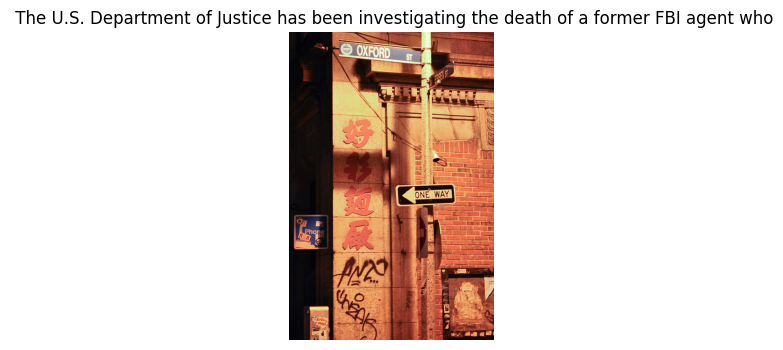

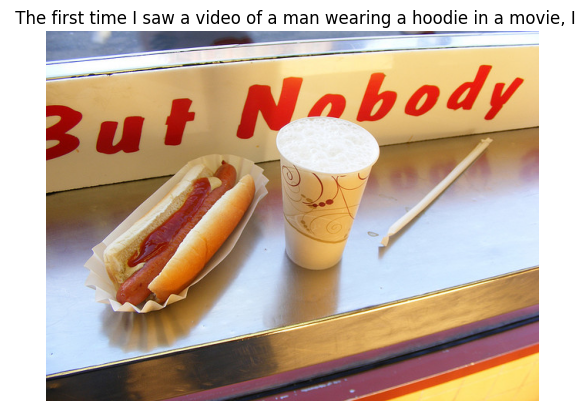

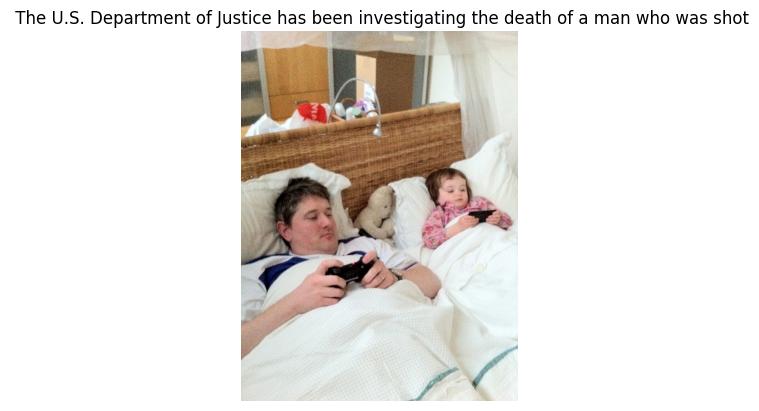

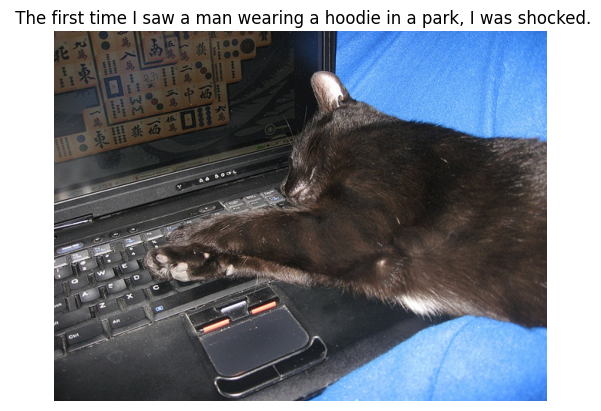

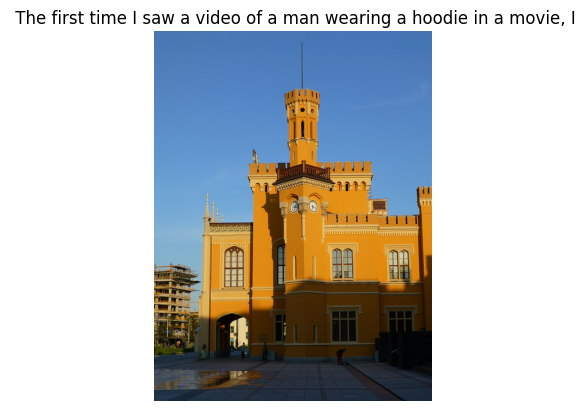

...

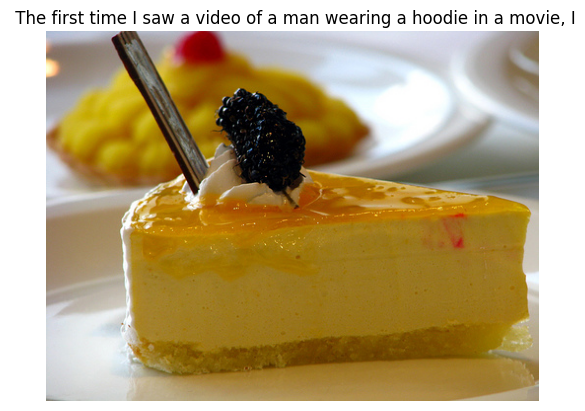

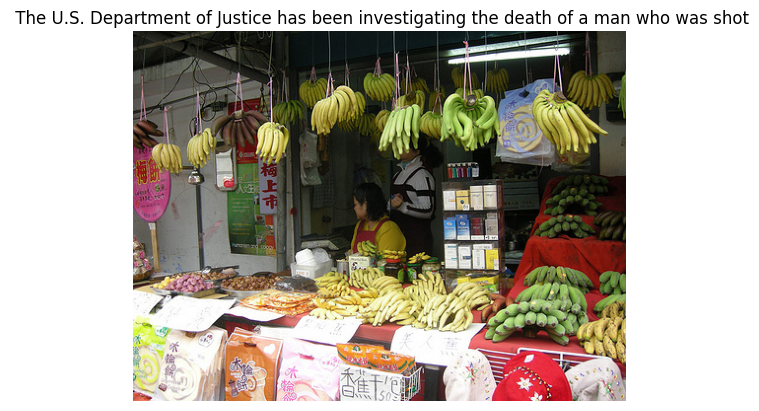

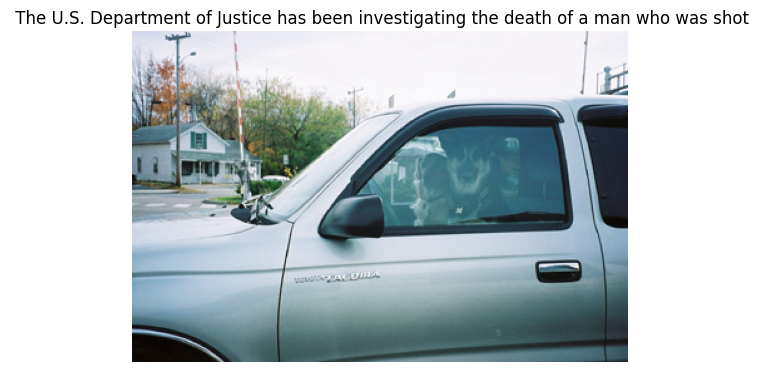

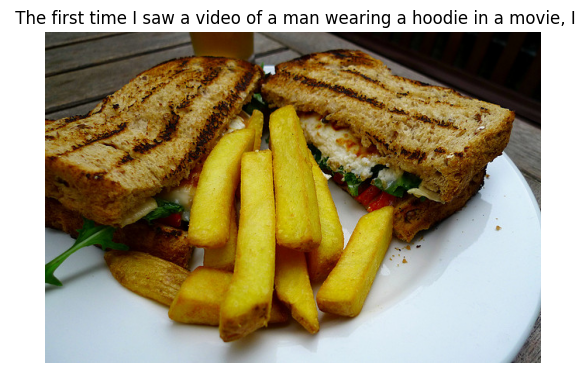

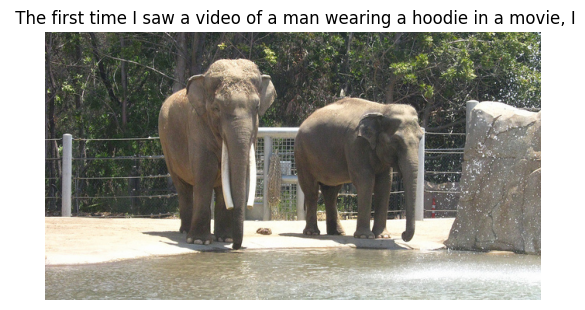

In [16]:
images_path = get_random_file_paths('./test2017/', 30)
plt.figure(figsize=(7, 4))
for path in images_path:
    plot_image(path)